<a href="https://colab.research.google.com/github/bhattacharyyad/Debnath_Code/blob/master/face_recog_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

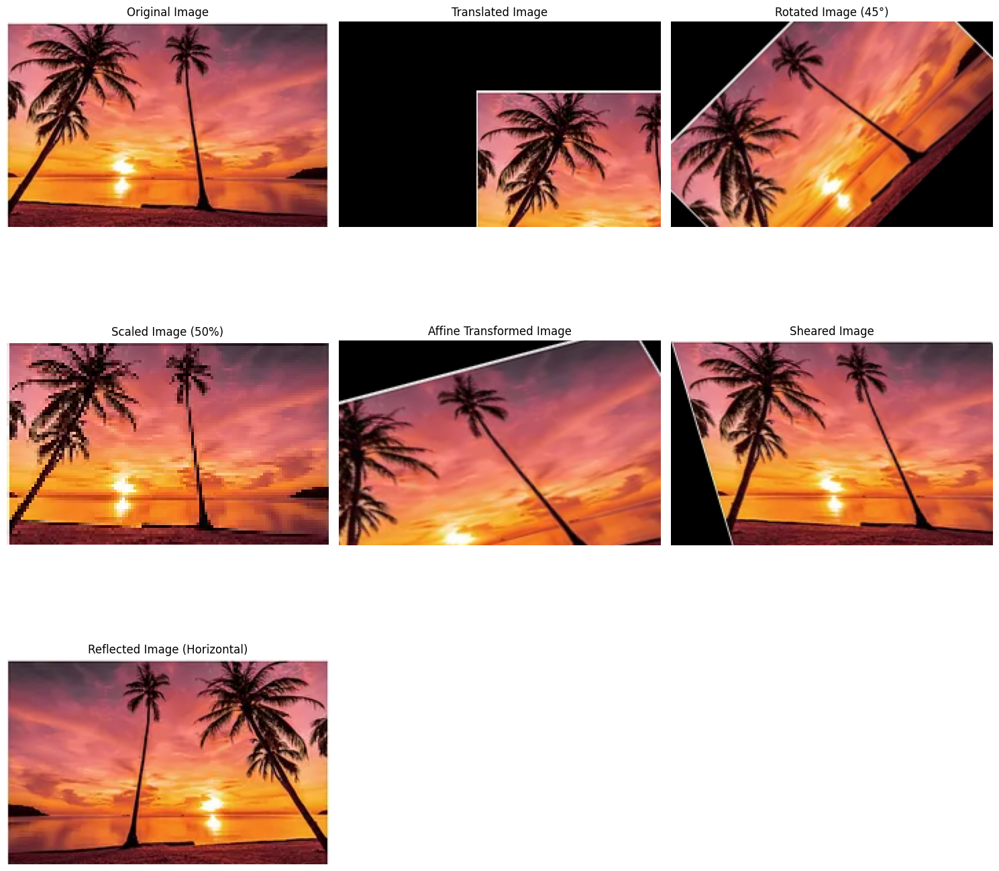

In [1]:
# Basic Computer Graphics — 2D Transformations
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image (you can provide the path of your own file, in any format)
img = cv2.imread('sun.png')
if img is None:
    raise FileNotFoundError("Image not found. Please check the file path.")

# Convert BGR (OpenCV default) to RGB for Matplotlib
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Get image dimensions
h, w = img.shape[:2]

# 1. Translation
tx, ty = 100, 50  # Shift by 100 pixels right, 50 pixels down
translation_matrix = np.float32([[1, 0, tx], [0, 1, ty]])
translated_img = cv2.warpAffine(img_rgb, translation_matrix, (w, h))

# 2. Rotation
angle = 45  # Rotate by 45 degrees
center = (w // 2, h // 2)  # Center of rotation
rotation_matrix = cv2.getRotationMatrix2D(center, angle, scale=1.0)
rotated_img = cv2.warpAffine(img_rgb, rotation_matrix, (w, h))

# 3. Scaling
scale_factor = 0.5  # Scale down to 50%
scaling_matrix = np.float32([[scale_factor, 0, 0], [0, scale_factor, 0]])
scaled_img = cv2.warpAffine(img_rgb, scaling_matrix, (int(w * scale_factor), int(h * scale_factor)))

# 4. Affine Transformation
pts1 = np.float32([[50, 50], [200, 50], [50, 200]])  # Source points
pts2 = np.float32([[10, 100], [200, 50], [100, 250]])  # Destination points
affine_matrix = cv2.getAffineTransform(pts1, pts2)
affine_img = cv2.warpAffine(img_rgb, affine_matrix, (w, h))

# 5. Shear (Horizontal Shear)
shear_factor = 0.3  # Shear factor (adjust for more/less shear)
shear_matrix = np.float32([[1, shear_factor, 0], [0, 1, 0]])
sheared_img = cv2.warpAffine(img_rgb, shear_matrix, (w, h))

# 6. Reflection (Horizontal Flip)
# For reflection across the vertical axis (horizontal flip), use flip
reflected_img = cv2.flip(img_rgb, 1)  # 1 = horizontal flip (x-axis reflection)

# Visualize using Matplotlib
plt.figure(figsize=(15, 15))

# Original image
plt.subplot(3, 3, 1)
plt.imshow(img_rgb)
plt.title('Original Image')
plt.axis('off')

# Translated image
plt.subplot(3, 3, 2)
plt.imshow(translated_img)
plt.title('Translated Image')
plt.axis('off')

# Rotated image
plt.subplot(3, 3, 3)
plt.imshow(rotated_img)
plt.title('Rotated Image (45°)')
plt.axis('off')

# Scaled image
plt.subplot(3, 3, 4)
plt.imshow(scaled_img)
plt.title('Scaled Image (50%)')
plt.axis('off')

# Affine transformed image
plt.subplot(3, 3, 5)
plt.imshow(affine_img)
plt.title('Affine Transformed Image')
plt.axis('off')

# Sheared image
plt.subplot(3, 3, 6)
plt.imshow(sheared_img)
plt.title('Sheared Image')
plt.axis('off')

# Reflected image
plt.subplot(3, 3, 7)
plt.imshow(reflected_img)
plt.title('Reflected Image (Horizontal)')
plt.axis('off')

# Display the plot
plt.tight_layout()
plt.show()

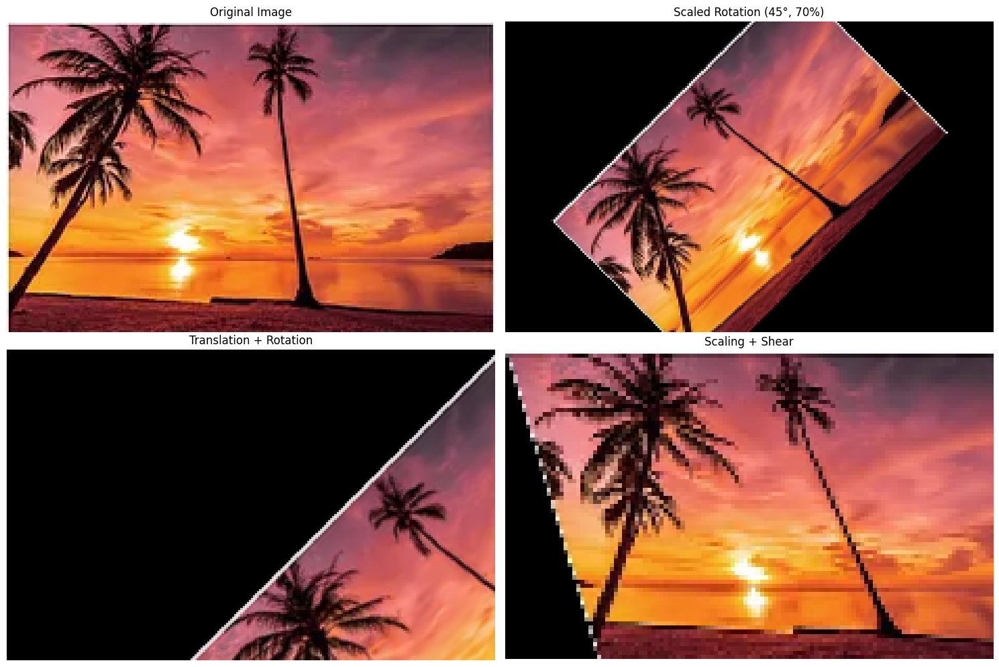

In [2]:
# Composite Transformations — Scaled Rotation
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image ((you can provide the path of your own file in any format))
img = cv2.imread('sun.png')
if img is None:
    raise FileNotFoundError("Image not found. Please check the file path.")

# Convert BGR (OpenCV default) to RGB for Matplotlib
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Get image dimensions
h, w = img.shape[:2]

# 1. Scaled Rotation (Scaling + Rotation)
angle = 45  # Rotate by 45 degrees
scale_factor = 0.7  # Scale to 70%
center = (w // 2, h // 2)  # Center of rotation
# Use getRotationMatrix2D to combine rotation and scaling
scaled_rotation_matrix = cv2.getRotationMatrix2D(center, angle, scale_factor)
scaled_rotated_img = cv2.warpAffine(img_rgb, scaled_rotation_matrix, (w, h))

# 2. Translation + Rotation
tx, ty = 100, 50  # Shift by 100 pixels right, 50 pixels down
# Get rotation matrix (2x3)
rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
# Convert rotation matrix to 3x3 homogeneous form
rotation_matrix_homogeneous = np.vstack((rotation_matrix, [0, 0, 1]))
# Define translation matrix (3x3 homogeneous form)
translation_matrix_homogeneous = np.float32([[1, 0, tx], [0, 1, ty], [0, 0, 1]])
# Combine: Translation * Rotation (apply rotation first, then translation)
composite_matrix_tr = np.dot(translation_matrix_homogeneous, rotation_matrix_homogeneous)
# Extract 2x3 matrix for warpAffine
composite_matrix_tr_2x3 = composite_matrix_tr[:2, :]
translated_rotated_img = cv2.warpAffine(img_rgb, composite_matrix_tr_2x3, (w, h))

# 3. Scaling + Shear
shear_factor = 0.3  # Horizontal shear factor
scaling_factor = 0.5  # Scale to 50%
# Scaling matrix (3x3 homogeneous form)
scaling_matrix_homogeneous = np.float32([[scaling_factor, 0, 0], [0, scaling_factor, 0], [0, 0, 1]])
# Shear matrix (3x3 homogeneous form)
shear_matrix_homogeneous = np.float32([[1, shear_factor, 0], [0, 1, 0], [0, 0, 1]])
# Combine: Shear * Scale (apply scaling first, then shear)
composite_matrix_ss = np.dot(shear_matrix_homogeneous, scaling_matrix_homogeneous)
# Extract 2x3 matrix for warpAffine
composite_matrix_ss_2x3 = composite_matrix_ss[:2, :]
scaled_sheared_img = cv2.warpAffine(img_rgb, composite_matrix_ss_2x3, (int(w * scaling_factor), int(h * scaling_factor)))

# Visualize using Matplotlib
plt.figure(figsize=(15, 10))

# Original image
plt.subplot(2, 2, 1)
plt.imshow(img_rgb)
plt.title('Original Image')
plt.axis('off')

# Scaled rotation
plt.subplot(2, 2, 2)
plt.imshow(scaled_rotated_img)
plt.title('Scaled Rotation (45°, 70%)')
plt.axis('off')

# Translation + rotation
plt.subplot(2, 2, 3)
plt.imshow(translated_rotated_img)
plt.title('Translation + Rotation')
plt.axis('off')

# Scaling + shear
plt.subplot(2, 2, 4)
plt.imshow(scaled_sheared_img)
plt.title('Scaling + Shear')
plt.axis('off')

# Display the plot
plt.tight_layout()
plt.show()

# Save the outputs (optional)
#cv2.imwrite('scaled_rotated_output.jpg', cv2.cvtColor(scaled_rotated_img, cv2.COLOR_RGB2BGR))
#cv2.imwrite('translated_rotated_output.jpg', cv2.cvtColor(translated_rotated_img, cv2.COLOR_RGB2BGR))
#cv2.imwrite('scaled_sheared_output.jpg', cv2.cvtColor(scaled_sheared_img, cv2.COLOR_RGB2BGR))

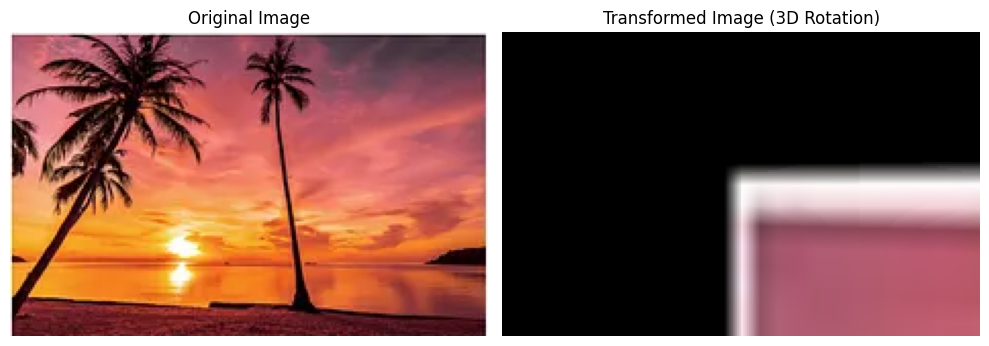

In [6]:
'''
3D Transformations

OpenCV primarily focuses on 2D image processing. 3D transformations typically involve manipulating an image in a 3D space, such as rotating, translating, or scaling it in three dimensions, often with perspective projection to map it back to a 2D plane for display.

3D Transformations include operations like rotation, translation, and scaling in 3D space, which are represented using 4x4 transformation matrices (to account for homogeneous coordinates).
Perspective Projection: Since images are 2D, after applying 3D transformations, you need to project the transformed points back onto a 2D plane using a perspective or orthographic projection.
OpenCV Tools: OpenCV provides functions like cv2.getPerspectiveTransform, cv2.warpPerspective, and matrix operations to handle transformations. For 3D, you’ll need to manually construct transformation matrices and handle projections.
Steps to Perform 3D Transformations

Load the Image: Read the image using cv2.imread.
Define 3D Points: Represent the image as a set of 3D points (e.g., assign a z-coordinate, typically 0, to the 2D image pixels).
Construct Transformation Matrices: Create 4x4 matrices for translation, rotation, or scaling in 3D.
Apply Transformations: Transform the 3D points using matrix multiplication.
Project to 2D: Use a perspective projection matrix to map the transformed 3D points back to 2D.
Warp the Image: Use cv2.warpPerspective to apply the resulting transformation to the image.
'''

# 3D Transformations
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread('sun.png')
if image is None:
    raise FileNotFoundError("Image file not found. Please check the path.")
h, w = image.shape[:2]

# Convert BGR (OpenCV format) to RGB for Matplotlib
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Define the 3D coordinates of the image corners (z=0 initially)
points_3d = np.float32([
    [0, 0, 0],    # Top-left
    [w, 0, 0],    # Top-right
    [w, h, 0],    # Bottom-right
    [0, h, 0]     # Bottom-left
])

# Define a 3D rotation matrix (e.g., rotate around Y-axis by 30 degrees)
theta = np.radians(30)
rotation_matrix_y = np.array([
    [np.cos(theta), 0, np.sin(theta), 0],
    [0, 1, 0, 0],
    [-np.sin(theta), 0, np.cos(theta), 0],
    [0, 0, 0, 1]
])

# Define a translation matrix (move along z-axis for perspective effect)
translation_matrix = np.array([
    [1, 0, 0, 0],
    [0, 1, 0, 0],
    [0, 0, 1, 50],  # Move 50 units along z
    [0, 0, 0, 1]
])

# Combine transformations
transformation_matrix = translation_matrix @ rotation_matrix_y

# Define camera parameters for perspective projection
focal_length = 500  # Adjust for desired perspective
camera_matrix = np.array([
    [focal_length, 0, w/2],
    [0, focal_length, h/2],
    [0, 0, 1]
])

# Apply transformation to 3D points
points_3d_homogeneous = np.hstack((points_3d, np.ones((4, 1))))
transformed_points = (transformation_matrix @ points_3d_homogeneous.T).T

# Project back to 2D using perspective projection
points_2d = []
for point in transformed_points:
    x, y, z, _ = point
    # Perspective projection: (x/z, y/z)
    points_2d.append([x/z * focal_length + w/2, y/z * focal_length + h/2])
points_2d = np.float32(points_2d)

# Original 2D points for perspective transform
points_2d_original = np.float32([
    [0, 0],
    [w, 0],
    [w, h],
    [0, h]
])

# Compute perspective transformation matrix
perspective_matrix = cv2.getPerspectiveTransform(points_2d_original, points_2d)

# Apply the transformation to the image
transformed_image = cv2.warpPerspective(image, perspective_matrix, (w, h))

# Convert transformed image from BGR to RGB for Matplotlib
transformed_image_rgb = cv2.cvtColor(transformed_image, cv2.COLOR_BGR2RGB)

# Display original and transformed images side by side using Matplotlib
plt.figure(figsize=(10, 5))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title('Original Image')
plt.axis('off')

# Transformed image
plt.subplot(1, 2, 2)
plt.imshow(transformed_image_rgb)
plt.title('Transformed Image (3D Rotation)')
plt.axis('off')

plt.tight_layout()
plt.show()


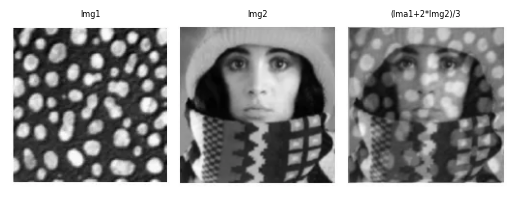

In [8]:
'''
Image Arithmetic

Image arithmetic in image processing involves performing mathematical operations on images, typically on their pixel values.

Images as Arrays: In digital image processing, images are represented as numerical arrays. For a grayscale image, this is a 2D array where each element is a pixel intensity (0–255 for 8-bit images). For a color image (e.g., RGB), it’s a 3D array with dimensions (height, width, channels).
Pixel-wise Operations: Image arithmetic applies operations (e.g., addition, subtraction) to corresponding pixel values across images or between an image and a scalar.
Applications: Common uses include image blending, background subtraction, brightness/contrast adjustment, and thresholding.
Common Image Arithmetic Operations

Here’s an overview of the primary arithmetic operations used in image processing, along with their purposes and OpenCV implementations.

1. Addition — Combines two images by adding their pixel values, often used for blending or overlaying images. For two images A and B, the result at pixel (x, y) is: Result(x, y) = A(x, y) + B(x, y). If the sum exceeds the pixel value range (e.g., 255 for 8-bit images), OpenCV clips the result to 255 unless specified otherwise.

OpenCV Function: `cv2.add(img1, img2)`
Example Use: Superimposing one image over another (e.g., adding a logo to a background).
2. Weighted Addition (Blending): Blends two images with specified weights to control the contribution of each image. For images A and B, with weights alpha and beta, and a scalar gamma:

Result(x, y) = alpha . A(x, y) + beta . B(x, y) +gamma

Typically, alpha +beta = 1 for normalized blending.

OpenCV Function: `cv2.addWeighted(img1, alpha, img2, beta, gamma)`
Example Use: Creating a fade effect between two images (e.g., for transitions).
3. Subtraction: Computes the difference between two images, useful for detecting changes or removing backgrounds. For images A and B:

Result(x, y) = A(x, y) — B(x, y)

Negative results are clipped to 0 in OpenCV’s `cv2.subtract`.

OpenCV Function: `cv2.subtract(img1, img2)`
Example Use: Motion detection (subtracting consecutive video frames) or background subtraction.
4. Multiplication: Scales pixel values, often used for masking or intensity adjustment. For an image A and a scalar or another image B:

Result(x, y) = A(x, y) . B(x, y) or A(x, y) . scalar

Results are clipped to the valid range (e.g., 0–255).

OpenCV Function: `cv2.multiply(img1, img2)` or NumPy multiplication (`img * scalar`).
Example Use: Applying a mask to isolate regions of interest.
5. Division: Divides pixel values, used for normalization or ratio-based processing. For image A and B:

Result(x, y) = A(x, y)/ B(x, y) if B(x, y) is not equal to 0

OpenCV Function: `cv2.divide(img1, img2)`
Example Use: Correcting illumination variations by dividing an image by a reference image.
6. Bitwise Operations: Perform logical operations (AND, OR, XOR, NOT) on pixel values, typically for masking or combining binary images. Operates on the binary representation of pixel values.

AND: `cv2.bitwise_and(img1, img2, mask=None)` — Keeps regions where both images have non-zero values.
OR: `cv2.bitwise_or(img1, img2)` — Combines non-zero regions.
XOR: `cv2.bitwise_xor(img1, img2)` — Highlights differences.
NOT: `cv2.bitwise_not(img)` — Inverts pixel values (e.g., 255 becomes 0).
Example Use: Applying a binary mask to extract specific image regions.
'''

#Image Arithmetic
import numpy as np
import matplotlib.pyplot as plt
import cv2


# Load the image
img1_path = 'img1.png'
img1 = cv2.imread(img1_path)

img2_path = 'img2.png'
img2 = cv2.imread(img2_path)


target_size = (img1.shape[1], img1.shape[0])  # (width, height)
# Resize img2 to match img1's dimensions
img2_resized = cv2.resize(img2, target_size, interpolation=cv2.INTER_AREA)

# Ensure same data type (e.g., uint8) to avoid type mismatch
img1 = img1.astype(np.float32)
img2_resized = img2_resized.astype(np.float32)


# Perform the weighted addition
result = (img1 + 2 * img2_resized) / 3
# Convert result back to uint8 for display
result = result.astype(np.uint8)
# Convert result from BGR to RGB for Matplotlib
result_rgb = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)

# Convert original images back to uint8 for display
img1 = img1.astype(np.uint8)
# Convert resized image 2 back to uint8 for display
img2_resized = img2_resized.astype(np.uint8)

#plotting
plt.subplot(131);
plt.title('Img1',size='xx-small');
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
plt.axis('off');

plt.subplot(1,3,2);
plt.title('Img2',size='xx-small');
plt.imshow(cv2.cvtColor(img2_resized, cv2.COLOR_BGR2RGB))
plt.axis('off');

plt.subplot(1,3,3);
plt.title('(Ima1+2*Img2)/3',size='xx-small');
plt.imshow(result_rgb);
plt.axis('off');

plt.subplots_adjust(hspace=0.3, wspace=0.05);


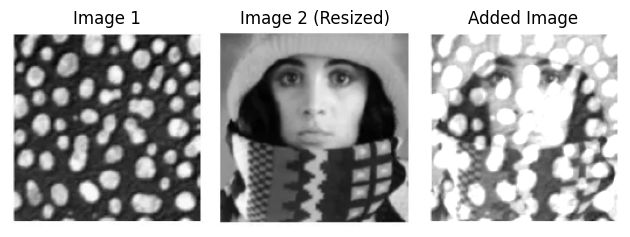

In [10]:
# Image Addition
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Load images in color
img1 = cv2.imread('img1.png')
img2 = cv2.imread('img2.png')

# Resize img2 to match img1's dimensions
target_size = (img1.shape[1], img1.shape[0])  # (width, height)
img2_resized = cv2.resize(img2, target_size, interpolation=cv2.INTER_AREA)

# Add images
result = cv2.add(img1, img2_resized)

# Convert to RGB for Matplotlib
img1_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2_rgb = cv2.cvtColor(img2_resized, cv2.COLOR_BGR2RGB)
result_rgb = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)

# Display images
#plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(img1_rgb)
plt.title('Image 1')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(img2_rgb)
plt.title('Image 2 (Resized)')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(result_rgb)
plt.title('Added Image')
plt.axis('off')

plt.tight_layout()
plt.show()

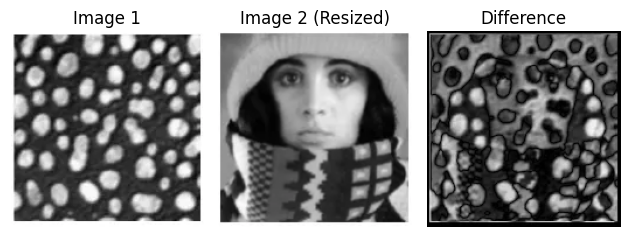

In [11]:
#Image Subtraction
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Load images in color
img1 = cv2.imread('img1.png')
img2 = cv2.imread('img2.png')

# Resize img2 to match img1's dimensions
target_size = (img1.shape[1], img1.shape[0])  # (width, height)
img2_resized = cv2.resize(img2, target_size, interpolation=cv2.INTER_AREA)

# Subtract images
diff = cv2.absdiff(img1, img2_resized)

# Convert to RGB for Matplotlib
img1_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2_rgb = cv2.cvtColor(img2_resized, cv2.COLOR_BGR2RGB)
diff_rgb = cv2.cvtColor(diff, cv2.COLOR_BGR2RGB)

# Display images
#plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(img1_rgb)
plt.title('Image 1')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(img2_rgb)
plt.title('Image 2 (Resized)')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(diff_rgb)
plt.title('Difference')
plt.axis('off')

plt.tight_layout()
plt.show()

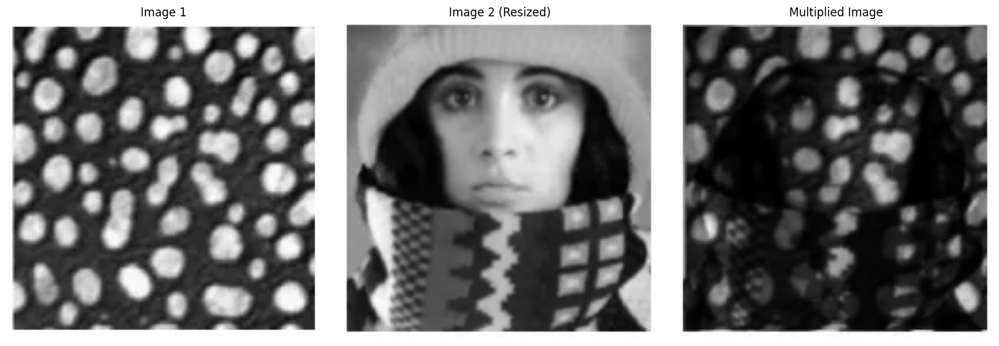

In [12]:
# Multiplication
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Load images in color
img1 = cv2.imread('img1.png')
img2 = cv2.imread('img2.png')

# Resize img2 to match img1's dimensions
target_size = (img1.shape[1], img1.shape[0])  # (width, height)
img2_resized = cv2.resize(img2, target_size, interpolation=cv2.INTER_AREA)

# Convert to float32 to avoid overflow
img1_float = img1.astype(np.float32) / 255.0
img2_float = img2_resized.astype(np.float32) / 255.0

# Multiply images
result = cv2.multiply(img1_float, img2_float)
result = (result * 255.0).astype(np.uint8)

# Convert to RGB for Matplotlib
img1_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2_rgb = cv2.cvtColor(img2_resized, cv2.COLOR_BGR2RGB)
result_rgb = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)

# Display images
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(img1_rgb)
plt.title('Image 1')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(img2_rgb)
plt.title('Image 2 (Resized)')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(result_rgb)
plt.title('Multiplied Image')
plt.axis('off')

plt.tight_layout()
plt.show()

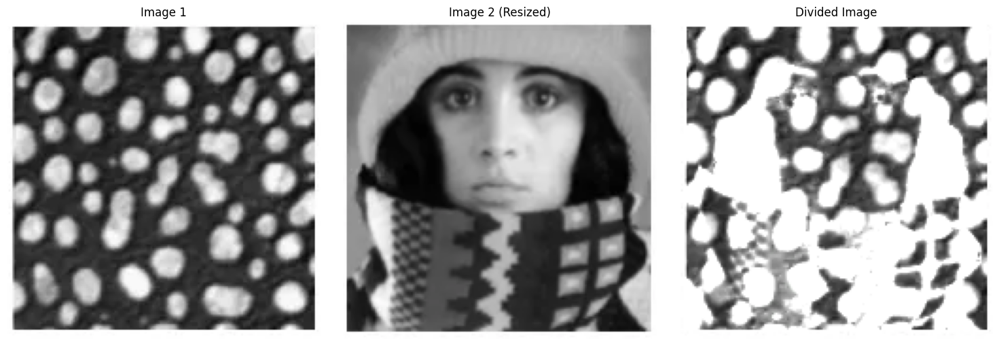

In [13]:
#Division
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Load images in color
img1 = cv2.imread('img1.png')
img2 = cv2.imread('img2.png')

# Resize img2 to match img1's dimensions
target_size = (img1.shape[1], img1.shape[0])  # (width, height)
img2_resized = cv2.resize(img2, target_size, interpolation=cv2.INTER_AREA)

# Convert to float32 to avoid division issues
img1_float = img1.astype(np.float32)
img2_float = img2_resized.astype(np.float32)

# Perform division, avoid division by zero
img2_float = np.where(img2_float == 0, 1, img2_float)  # Replace 0 with 1
result = cv2.divide(img1_float, img2_float)
result = np.clip(result * 255.0, 0, 255).astype(np.uint8)

# Convert to RGB for Matplotlib
img1_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2_rgb = cv2.cvtColor(img2_resized, cv2.COLOR_BGR2RGB)
result_rgb = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)

# Display images
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(img1_rgb)
plt.title('Image 1')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(img2_rgb)
plt.title('Image 2 (Resized)')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(result_rgb)
plt.title('Divided Image')
plt.axis('off')

plt.tight_layout()
plt.show()

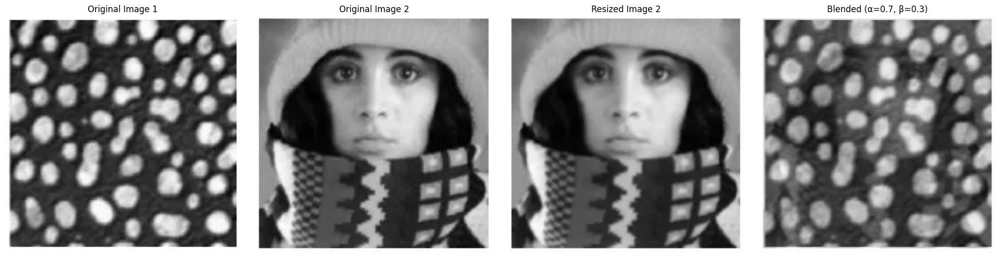

In [14]:
#alpha blending
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Load the images
img1 = cv2.imread('img1.png')
img2 = cv2.imread('img2.png')

# Check if images loaded successfully
if img1 is None or img2 is None:
    print("Error: Could not load one or both images. Check file paths.")
else:
    # Step 1: Get target size (use img1's dimensions)
    target_size = (img1.shape[1], img1.shape[0])  # (width, height)

    # Step 2: Resize img2 to match img1's dimensions
    img2_resized = cv2.resize(img2, target_size, interpolation=cv2.INTER_AREA)

    # Step 3: Perform alpha blending
    alpha = 0.7  # Weight for img1
    beta = 0.3   # Weight for img2 (alpha + beta = 1.0 for smooth blending)
    gamma = 0.0  # Scalar offset
    blended = cv2.addWeighted(img1, alpha, img2_resized, beta, gamma)

    # Convert images to RGB for Matplotlib
    img1_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
    img2_rgb = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
    img2_resized_rgb = cv2.cvtColor(img2_resized, cv2.COLOR_BGR2RGB)
    blended_rgb = cv2.cvtColor(blended, cv2.COLOR_BGR2RGB)

    # Create a figure with subplots to visualize all steps
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))

    # Plot original img1
    axes[0].imshow(img1_rgb)
    axes[0].set_title('Original Image 1')
    axes[0].axis('off')

    # Plot original img2
    axes[1].imshow(img2_rgb)
    axes[1].set_title('Original Image 2')
    axes[1].axis('off')

    # Plot resized img2
    axes[2].imshow(img2_resized_rgb)
    axes[2].set_title('Resized Image 2')
    axes[2].axis('off')

    # Plot blended result
    axes[3].imshow(blended_rgb)
    axes[3].set_title(f'Blended (α={alpha}, β={beta})')
    axes[3].axis('off')

    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.show()


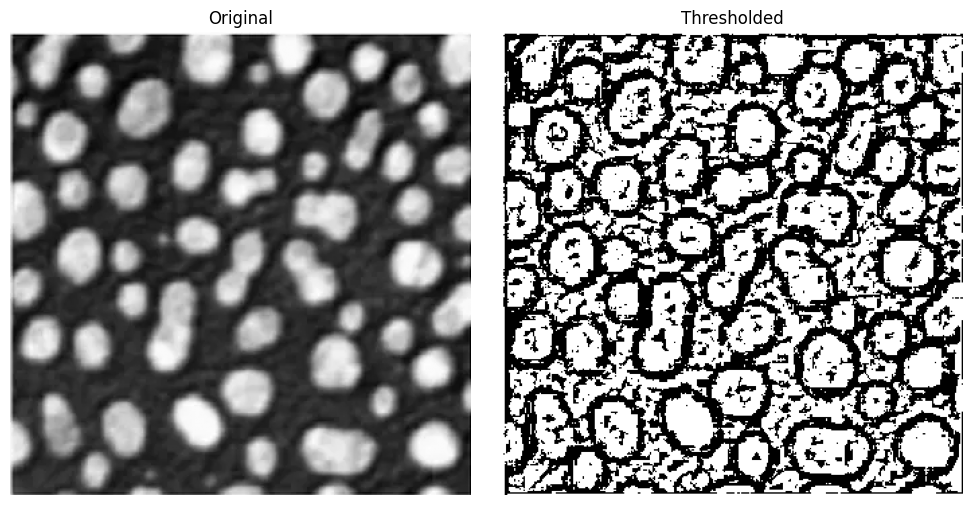

In [16]:
'''
Thresholding

Thresholding in image processing is a technique to convert a grayscale image into a binary image (black and white) by separating pixels into two groups based on their intensity values. Pixels above a specified threshold are set to a maximum value (usually white, 255), and those below are set to a minimum value (usually black, 0). This simplifies images for tasks like segmentation, object detection, or edge extraction.

In the provided OpenCV code:

cv2.threshold(img, 127, 255, cv2.THRESH_BINARY):
img: Grayscale input image.
127: Threshold value (0–255). Pixels ≥127 become 255; pixels <127 become 0.
255: Maximum value for pixels above the threshold.
cv2.THRESH_BINARY: Binary thresholding type (other types include THRESH_BINARY_INV, THRESH_TRUNC, etc.).
Output is a binary image (thresh) where pixel values are either 0 or 255.

Original grayscale image: Varies from 0 (black) to 255 (white). After thresholding the output contains only black (0) or white (255), simplifying the image for further analysis. Adaptive thresholding (cv2.adaptiveThreshold) adjusts the threshold dynamically for different image regions.
'''

# Thresholding
import cv2
import matplotlib.pyplot as plt

# Load image in grayscale
img = cv2.imread('img3.png', cv2.IMREAD_GRAYSCALE)

# Apply binary thresholding
#_, thresh = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)
thresh = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
# Display images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(thresh, cmap='gray')
plt.title('Thresholded')
plt.axis('off')

plt.tight_layout()
plt.show()

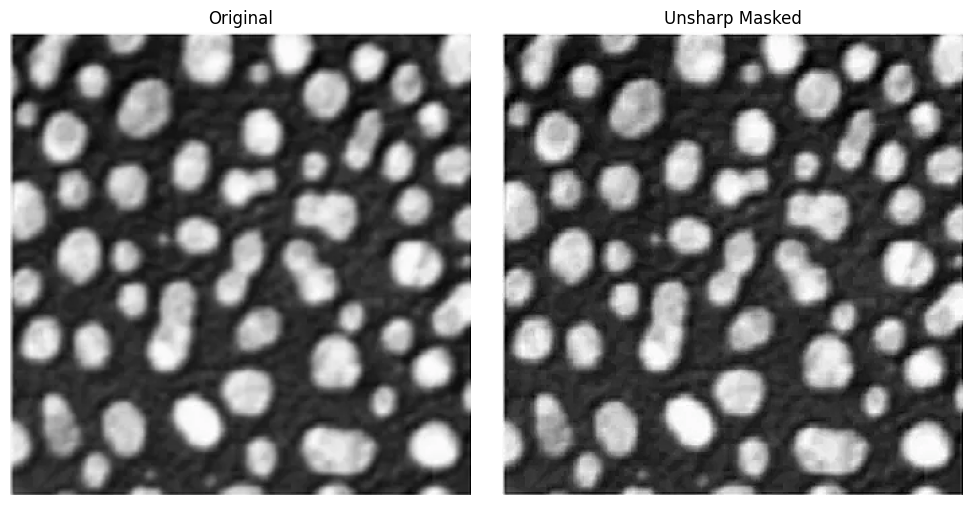

In [17]:
'''
Unsharp Masking

Unsharp masking is used to enhance the sharpness of an image by amplifying its high-frequency components (edges and details). It works by subtracting a blurred (smoothed) version of the image from the original, creating a mask that highlights edges, and then adding this mask back to the original image with a scaling factor to increase contrast at edges.

How It Works

Blur the Image: Apply a Gaussian blur (or similar) to create a smoothed version of the image, reducing high-frequency details.
Create Unsharp Mask: Subtract the blurred image from the original to isolate edges and details (high-frequency components).
Enhance Edges: Add the scaled mask back to the original image to boost edge contrast.
'''

import cv2
import matplotlib.pyplot as plt
import numpy as np

# Load image in color
img = cv2.imread('img3.png')

# Apply Gaussian blur
blur = cv2.GaussianBlur(img, (5, 5), 0)

# Create unsharp mask
mask = img.astype(float) - blur.astype(float)

# Apply sharpening (k = 1.0 for moderate effect)
k = 1.0
sharpened = img.astype(float) + k * mask
sharpened = np.clip(sharpened, 0, 255).astype(np.uint8)

# Convert to RGB for Matplotlib
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
sharpened_rgb = cv2.cvtColor(sharpened, cv2.COLOR_BGR2RGB)

# Display images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title('Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(sharpened_rgb)
plt.title('Unsharp Masked')
plt.axis('off')

plt.tight_layout()
plt.show()

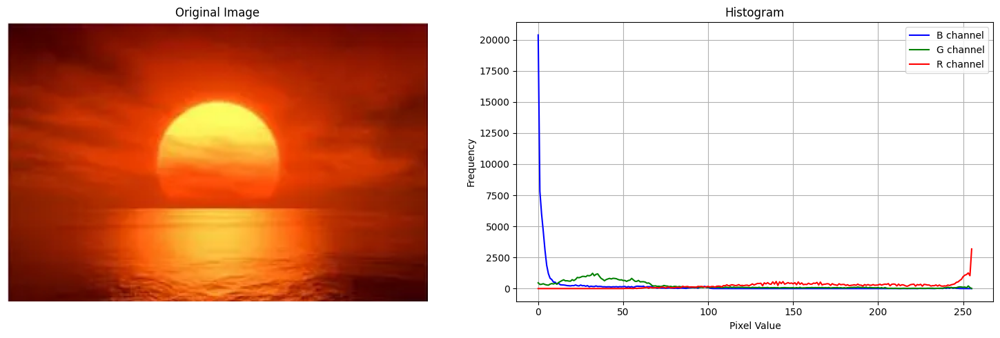

In [19]:
# Histogram of an Image

import cv2
import matplotlib.pyplot as plt
import numpy as np

# Load image in color
img = cv2.imread('img4.png')

# Convert to RGB for Matplotlib
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Calculate histogram for each channel
colors = ('b', 'g', 'r')
histograms = []
for i, color in enumerate(colors):
    hist = cv2.calcHist([img], [i], None, [256], [0, 256])
    histograms.append(hist)

# Plot images and histograms
plt.figure(figsize=(15, 5))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title('Original Image')
plt.axis('off')

# Histogram
plt.subplot(1, 2, 2)
for i, (hist, color) in enumerate(zip(histograms, colors)):
    plt.plot(hist, color=color, label=f'{color.upper()} channel')
plt.title('Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

In [20]:
'''
Histogram Equalization
Histogram Equalization is a technique that redistributes pixel intensities to enhance contrast by spreading out the most frequent intensity values. However, it can amplify noise and fail in images with locally varying contrast.

Adaptive Histogram Equalization (AHE): Improves on global equalization by dividing the image into small regions (tiles) and applying histogram equalization to each region independently. This adapts to local contrast variations but can over-amplify noise in homogeneous regions.

CLAHE: Enhances AHE by introducing a clip limit to restrict the amplification of pixel intensities, preventing noise amplification and unnatural contrast in uniform areas.CLAHE uses parameters such as Clip limit and Tile Grid size. Clip Limit controls the maximum amplification of contrast (e.g., 2.0 or 4.0). Higher values allow more contrast enhancement but may increase noise. Tile Grid Size defines the number of tiles (e.g., 8x8). Smaller tiles adapt to finer details but increase computation time.
'''

'\nHistogram Equalization\nHistogram Equalization is a technique that redistributes pixel intensities to enhance contrast by spreading out the most frequent intensity values. However, it can amplify noise and fail in images with locally varying contrast.\n\nAdaptive Histogram Equalization (AHE): Improves on global equalization by dividing the image into small regions (tiles) and applying histogram equalization to each region independently. This adapts to local contrast variations but can over-amplify noise in homogeneous regions.\n\nCLAHE: Enhances AHE by introducing a clip limit to restrict the amplification of pixel intensities, preventing noise amplification and unnatural contrast in uniform areas.CLAHE uses parameters such as Clip limit and Tile Grid size. Clip Limit controls the maximum amplification of contrast (e.g., 2.0 or 4.0). Higher values allow more contrast enhancement but may increase noise. Tile Grid Size defines the number of tiles (e.g., 8x8). Smaller tiles adapt to fi

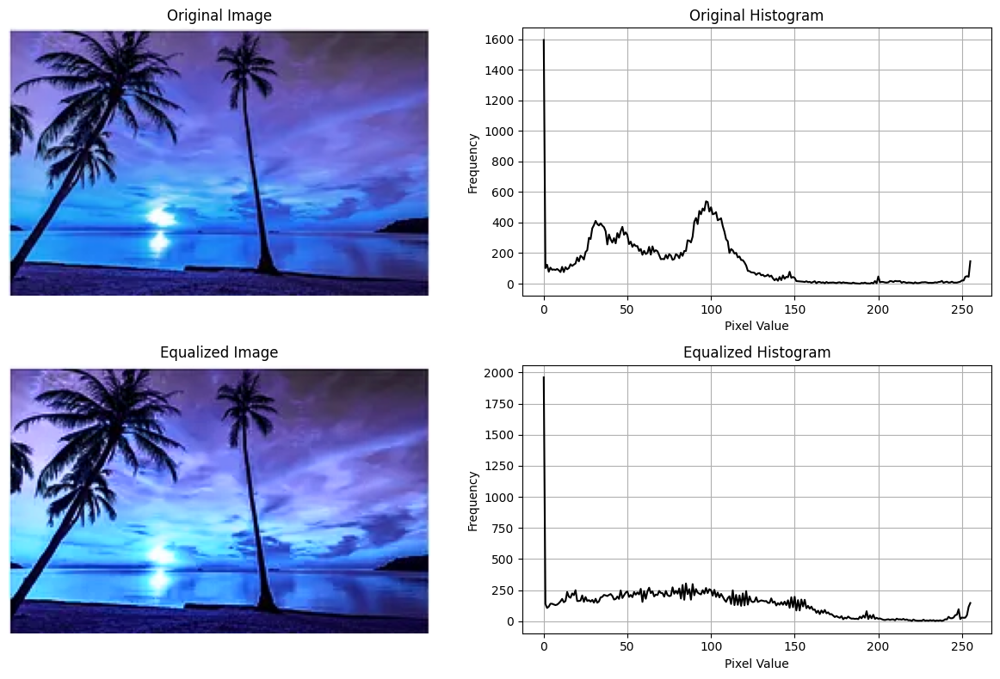

In [22]:
# histogram equalization
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Load image in grayscale
img = cv2.imread('sun.png')
img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
img_yuv[:,:,0] = cv2.equalizeHist(img_yuv[:,:,0])
img_eq = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)

# Perform histogram equalization
#img_eq = cv2.equalizeHist(img)

# Compute histograms
hist_orig = cv2.calcHist([img], [0], None, [256], [0, 256])
hist_eq = cv2.calcHist([img_eq], [0], None, [256], [0, 256])

# Plot images and histograms
plt.figure(figsize=(12, 8))

# Original image
plt.subplot(2, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Original histogram
plt.subplot(2, 2, 2)
plt.plot(hist_orig, color='black')
plt.title('Original Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.grid(True)

# Equalized image
plt.subplot(2, 2, 3)
plt.imshow(img_eq, cmap='gray')
plt.title('Equalized Image')
plt.axis('off')

# Equalized histogram
plt.subplot(2, 2, 4)
plt.plot(hist_eq, color='black')
plt.title('Equalized Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.grid(True)

plt.tight_layout()
plt.show()

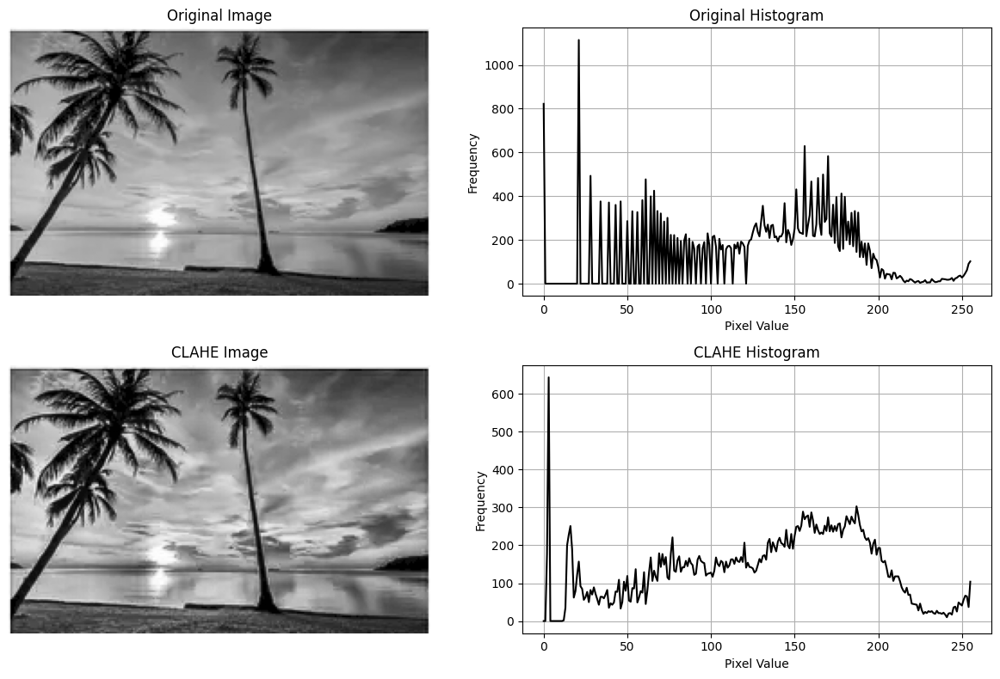

In [23]:
# Contrast Limited Adaptive Histogram Equalization (CLAHE)

import cv2
import matplotlib.pyplot as plt
import numpy as np

# Load image in grayscale
img = cv2.imread('sun.png', cv2.IMREAD_GRAYSCALE)

# Create CLAHE object
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

# Apply CLAHE
img_clahe = clahe.apply(img)

# Compute histograms
hist_orig = cv2.calcHist([img], [0], None, [256], [0, 256])
hist_clahe = cv2.calcHist([img_clahe], [0], None, [256], [0, 256])

# Plot images and histograms
plt.figure(figsize=(12, 8))

# Original image
plt.subplot(2, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Original histogram
plt.subplot(2, 2, 2)
plt.plot(hist_orig, color='black')
plt.title('Original Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.grid(True)

# CLAHE image
plt.subplot(2, 2, 3)
plt.imshow(img_clahe, cmap='gray')
plt.title('CLAHE Image')
plt.axis('off')

# CLAHE histogram
plt.subplot(2, 2, 4)
plt.plot(hist_clahe, color='black')
plt.title('CLAHE Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.grid(True)

plt.tight_layout()
plt.show()

In [24]:
'''
Linear Filtering
Linear filtering in image processing is a technique that applies a linear operation to an image using a filter (or kernel) to modify its pixel values. It involves convolving the image with a small matrix (filter) to achieve effects like smoothing, sharpening, edge detection, or noise reduction. The process is linear because the output at each pixel is a weighted sum of neighboring pixel values, following the superposition principle.

How It Works

Convolution: The filter slides over the image, computing the dot product of the filter coefficients and the overlapping pixel values.
Filter/Kernel: A small matrix (e.g., 3x3) with weights that define the operation (e.g., averaging for smoothing, differential for edges).
Output: Each pixel in the resulting image is the sum of the product of the filter and the local image patch, often normalized.
Common Types of Linear Filtering

Smoothing (Low-Pass): Uses a filter like a Gaussian kernel to average pixels, reducing noise (e.g., cv2.GaussianBlur).
Sharpening (High-Pass): Uses a filter to enhance edges (e.g., unsharp masking with a Laplacian kernel).
Edge Detection: Uses filters like Sobel or Prewitt to highlight edges.
'''

'\nLinear Filtering\nLinear filtering in image processing is a technique that applies a linear operation to an image using a filter (or kernel) to modify its pixel values. It involves convolving the image with a small matrix (filter) to achieve effects like smoothing, sharpening, edge detection, or noise reduction. The process is linear because the output at each pixel is a weighted sum of neighboring pixel values, following the superposition principle.\n\nHow It Works\n\nConvolution: The filter slides over the image, computing the dot product of the filter coefficients and the overlapping pixel values.\nFilter/Kernel: A small matrix (e.g., 3x3) with weights that define the operation (e.g., averaging for smoothing, differential for edges).\nOutput: Each pixel in the resulting image is the sum of the product of the filter and the local image patch, often normalized.\nCommon Types of Linear Filtering\n\nSmoothing (Low-Pass): Uses a filter like a Gaussian kernel to average pixels, reducin

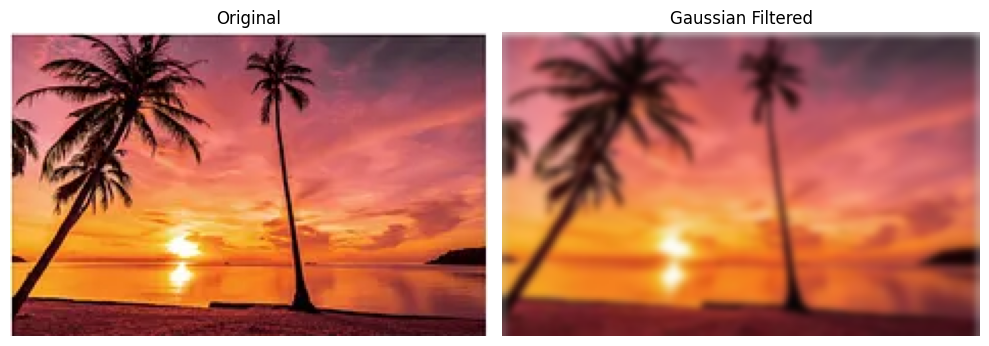

In [25]:
# Gaussian Blur
import cv2
import matplotlib.pyplot as plt

# Load image
img = cv2.imread('sun.png')

# Apply linear filtering (e.g., Gaussian blur)
filtered = cv2.GaussianBlur(img, (9, 9), 0)

# Convert to RGB for Matplotlib
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
filtered_rgb = cv2.cvtColor(filtered, cv2.COLOR_BGR2RGB)

# Display
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title('Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(filtered_rgb)
plt.title('Gaussian Filtered')
plt.axis('off')

plt.tight_layout()
plt.show()

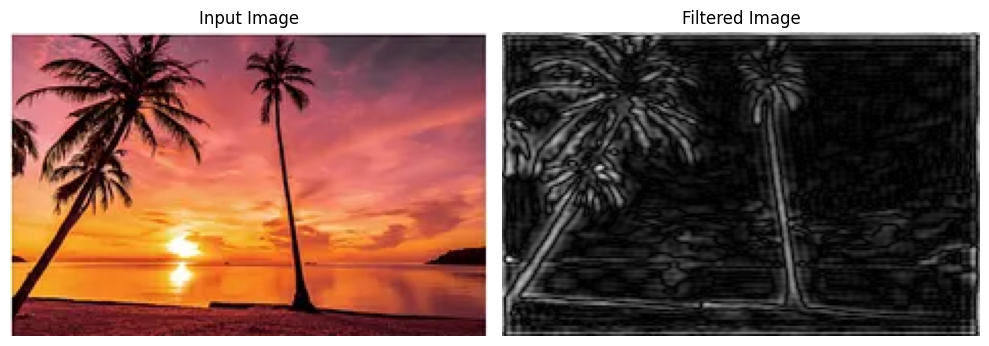

In [26]:
'''
A band-pass filter is a signal processing technique that allows signals within a specific frequency range to
pass through while attenuating (reducing) signals outside that range. In the context of image processing,
it’s used to isolate features in an image that correspond to a certain range of spatial frequencies, effectively
filtering out both very low-frequency components (like smooth gradients) and very high-frequency components (like noise or fine details).
'''

# Band-Pass Filter
import cv2
import numpy as np
import matplotlib.pyplot as plt

def band_pass_filter(image, low_freq, high_freq):
    # Convert image to grayscale if it's not
    if len(image.shape) == 3:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Perform FFT
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)

    # Create band-pass filter
    rows, cols = image.shape
    crow, ccol = rows // 2, cols // 2
    mask = np.zeros((rows, cols), np.uint8)

    # Create circular masks
    y, x = np.ogrid[-crow:rows-crow, -ccol:cols-ccol]
    mask_area = (x**2 + y**2 >= low_freq**2) & (x**2 + y**2 <= high_freq**2)
    mask[mask_area] = 1

    # Apply mask and inverse FFT
    fshift = fshift * mask
    f_ishift = np.fft.ifftshift(fshift)
    img_back = np.fft.ifft2(f_ishift)
    img_back = np.abs(img_back)

    # Normalize output
    img_back = cv2.normalize(img_back, None, 0, 255, cv2.NORM_MINMAX)
    return np.uint8(img_back)


# Load image
img = cv2.imread('sun.png')

# Convert to RGB for matplotlib display
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Apply band-pass filter
filtered_img = band_pass_filter(img, low_freq=10, high_freq=50)
# Display input and output images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title('Input Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(filtered_img, cmap='gray')
plt.title('Filtered Image')
plt.axis('off')

plt.tight_layout()
plt.show()

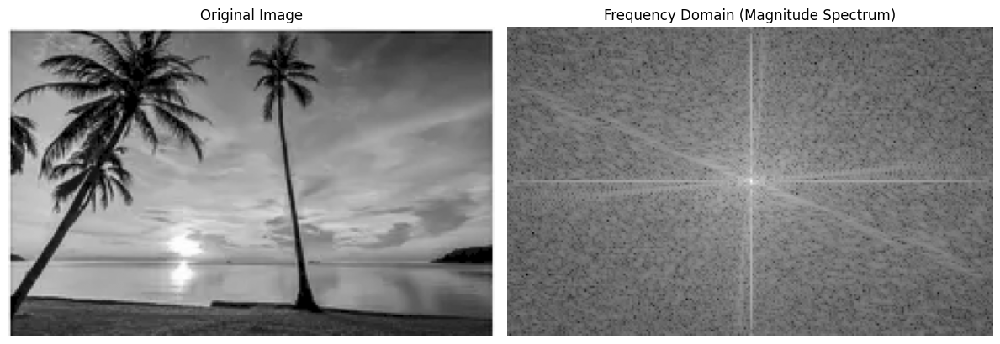

In [27]:
# Frequency Domain Representation of an Image — Fourier Analysis and Transform
'''
To see the frequency domain representation of an image in OpenCV, you need to perform a 2D Fast Fourier Transform (FFT)
using cv2.dft, (for digital images it is discrete fourier transform (dft)) which converts the spatial domain image into the frequency domain.
The frequency domain represents the image as a combination of sine and cosine waves, highlighting spatial frequency components (e.g., edges, textures).
The result is typically visualized as a magnitude spectrum, often with a logarithmic scale for better contrast
'''

import cv2
import matplotlib.pyplot as plt
import numpy as np

# Load image in grayscale
img = cv2.imread('sun.png', cv2.IMREAD_GRAYSCALE)

# Apply 2D DFT
dft = cv2.dft(np.float32(img), flags=cv2.DFT_COMPLEX_OUTPUT)
dft_shift = np.fft.fftshift(dft)

# Compute magnitude spectrum
magnitude_spectrum = 20 * np.log(cv2.magnitude(dft_shift[:,:,0], dft_shift[:,:,1]) + 1)

# Display
plt.figure(figsize=(12, 5))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Frequency domain
plt.subplot(1, 2, 2)
plt.imshow(magnitude_spectrum, cmap='gray')
plt.title('Frequency Domain (Magnitude Spectrum)')
plt.axis('off')

plt.tight_layout()
plt.show()


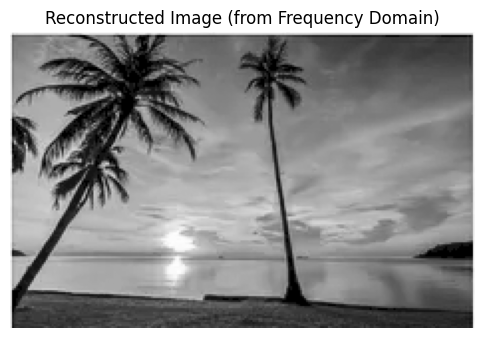

In [29]:
# Inverse FFT for Reconstruction of Spatial Image from Frequency Domain
# Inverse FFT (Reconstruction)
import numpy as np
# Shift back (inverse of np.fft.fftshift)
idft_shift = np.fft.ifftshift(dft_shift)

# Apply inverse DFT
img_reconstructed = cv2.idft(idft_shift)
img_reconstructed = cv2.magnitude(img_reconstructed[:,:,0], img_reconstructed[:,:,1])

# Normalize for display (optional)
img_reconstructed = cv2.normalize(img_reconstructed, None, 0, 255, cv2.NORM_MINMAX)
img_reconstructed = np.uint8(img_reconstructed)

# Show reconstructed grayscale image
plt.figure(figsize=(6,6))
plt.imshow(img_reconstructed, cmap='gray')
plt.title('Reconstructed Image (from Frequency Domain)')
plt.axis('off')
plt.show()

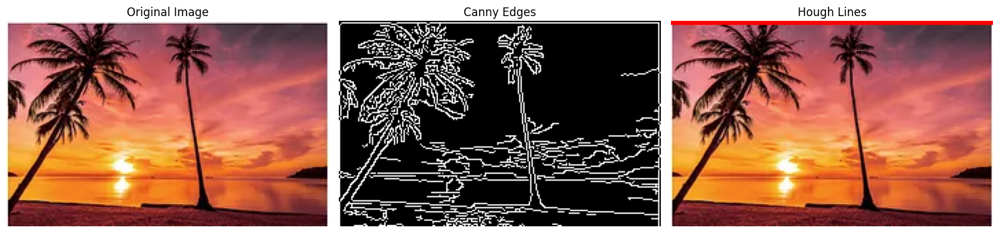

In [30]:
'''
Edge Detection
Edge detection is an image processing technique to identify boundaries (edges) in an image where pixel intensity changes sharply,
indicating transitions between objects or regions. It works by detecting significant gradients in pixel values, often using methods
like Sobel, Prewitt, or Canny. In OpenCV, edge detection is typically applied to grayscale images and is crucial for tasks like
object recognition, shape analysis, and feature extraction. For example, the Canny edge detector uses gradient computation,
non-maximum suppression, and thresholding to produce a binary edge map.

Hough Transform

The Hough Transform is a feature extraction technique in image processing used to detect geometric shapes, like lines or circles, in an image.
It transforms points in image space (x, y) into a parameter space (e.g., slope-intercept or polar coordinates for lines) where shapes are
represented by peaks in an accumulator array. By voting in this parameter space, it identifies shapes even in noisy or incomplete images.
Commonly used in edge detection pipelines, like after Canny edge detection.
'''

import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image
image = cv2.imread('sun.png')  # Replace with your image path
if image is None:
    raise Exception("Image not found")

# Convert BGR to RGB for correct color display in Matplotlib
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply edge detection
edges = cv2.Canny(gray, 50, 150, apertureSize=3)

# Apply Hough Line Transform
lines = cv2.HoughLines(edges, 1, np.pi / 180, 200)

# Draw lines on the RGB image
output_image = image_rgb.copy()
if lines is not None:
    for rho, theta in lines[:, 0]:
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a * rho
        y0 = b * rho
        x1 = int(x0 + 1000 * (-b))
        y1 = int(y0 + 1000 * (a))
        x2 = int(x0 - 1000 * (-b))
        y2 = int(y0 - 1000 * (a))
        cv2.line(output_image, (x1, y1), (x2, y2), (255, 0, 0), 2)

# Visualize using Matplotlib
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(image_rgb)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(edges, cmap='gray')
plt.title('Canny Edges')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(output_image)
plt.title('Hough Lines')
plt.axis('off')

plt.tight_layout()
plt.show()

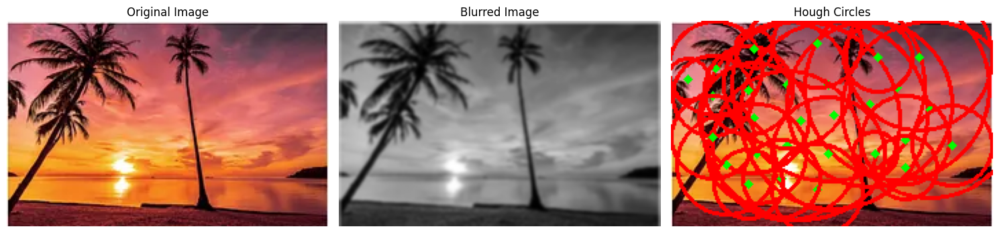

In [31]:
# Hough Transform for Curve Fitting

import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image
image = cv2.imread('sun.png')  # Replace with your image path
if image is None:
    raise Exception("Image not found")

# Convert BGR to RGB for correct color display in Matplotlib
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply Gaussian blur to reduce noise
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

# Apply Hough Circle Transform
circles = cv2.HoughCircles(
    blurred,
    cv2.HOUGH_GRADIENT,
    dp=1,  # Inverse ratio of the accumulator resolution
    minDist=20,  # Minimum distance between circle centers
    param1=50,  # Upper threshold for Canny edge detector
    param2=30,  # Accumulator threshold for circle detection
    minRadius=10,  # Minimum circle radius
    maxRadius=100  # Maximum circle radius
)

# Draw detected circles on the RGB image
output_image = image_rgb.copy()
if circles is not None:
    circles = np.uint16(np.around(circles))
    for i in circles[0, :]:
        # Draw circle center
        center = (i[0], i[1])
        cv2.circle(output_image, center, 1, (0, 255, 0), 3)
        # Draw circle outline
        radius = i[2]
        cv2.circle(output_image, center, radius, (255, 0, 0), 2)

# Visualize using Matplotlib
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(image_rgb)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(blurred, cmap='gray')
plt.title('Blurred Image')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(output_image)
plt.title('Hough Circles')
plt.axis('off')

plt.tight_layout()
plt.show()

4.12.0
True


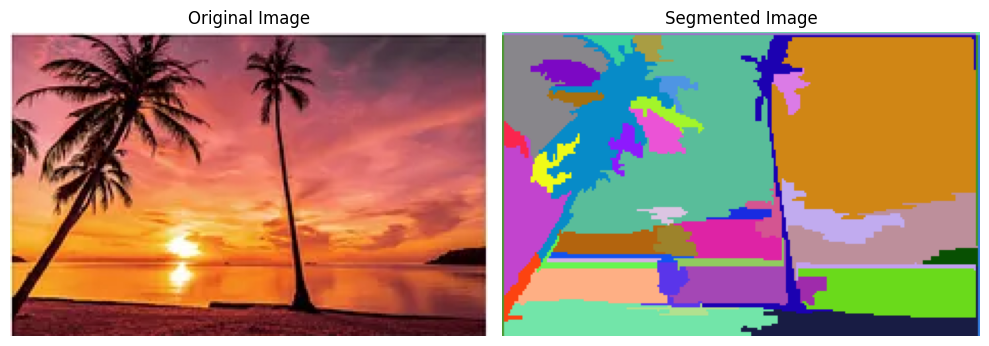

In [34]:
'''
Image Segmentation
Image segmentation is an image processing technique that partitions an image into multiple regions or segments, each representing a distinct object or area based on pixel characteristics like color, intensity, or texture. It aims to simplify image analysis by isolating meaningful parts for further processing.

Common methods include:

Thresholding: Separates pixels based on intensity (e.g., Otsu’s method).
Clustering: Groups pixels using algorithms like K-means or mean-shift.
Edge-based: Uses edges (e.g., from Canny) to define boundaries.
Region-based: Grows or splits regions based on similarity (e.g., watershed).
Deep Learning: Uses neural networks (e.g., U-Net) for semantic or instance segmentation.
In OpenCV, functions like cv2.threshold, cv2.watershed, or cv2.grabCut support segmentation.

You need to install opencv_contrib for following operations.
'''
import cv2
print(cv2.__version__)
print(hasattr(cv2, 'ximgproc')) # it should print True

import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
img = cv2.imread('sun.png')
if img is None:
    raise FileNotFoundError("Image not found. Please check the file path.")

# Convert BGR (OpenCV default) to RGB for Matplotlib
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Convert image to float32 (required for graph segmentation)
img_float = img.astype(np.float32)

# Create the graph segmentation object
gs = cv2.ximgproc.segmentation.createGraphSegmentation(
    sigma=0.5,  # Controls smoothness (higher = smoother segments)
    k=300,      # Controls segment size (higher = larger segments)
    min_size=100  # Minimum size of segments (in pixels)
)

# Process the image to get segments (labels)
segments = gs.processImage(img_float)

# Create a color-mapped output for visualization
unique_segments = np.unique(segments)
num_segments = len(unique_segments)
colors = np.random.randint(0, 255, size=(num_segments, 3), dtype=np.uint8)

# Generate segmented image with random colors for each segment
output = np.zeros_like(img)
for i, seg_id in enumerate(unique_segments):
    mask = (segments == seg_id)
    output[mask] = colors[i]

# Convert segmented output to RGB for Matplotlib
output_rgb = cv2.cvtColor(output, cv2.COLOR_BGR2RGB)

# Visualize using Matplotlib
plt.figure(figsize=(10, 5))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title('Original Image')
plt.axis('off')

# Segmented image
plt.subplot(1, 2, 2)
plt.imshow(output_rgb)
plt.title('Segmented Image')
plt.axis('off')

# Display the plot
plt.tight_layout()
plt.show()

# Save the output (optional)
#cv2.imwrite('segmented_output.jpg', output)


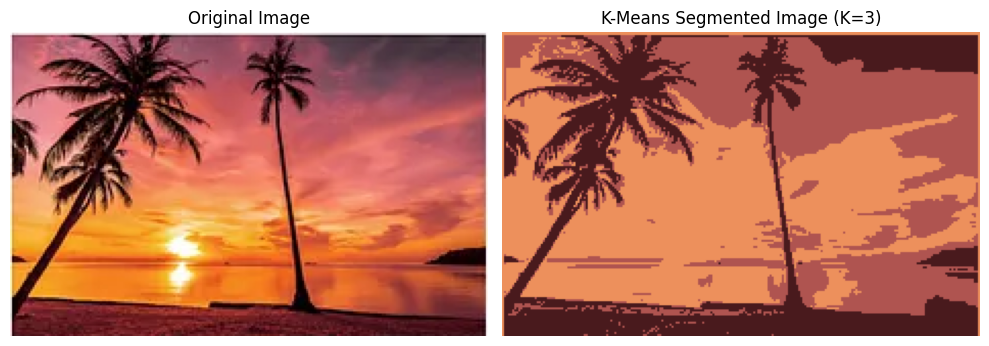

In [38]:
#Segmentation using K-means clustering
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image (replace 'input_image.jpg' with your image path)
img = cv2.imread('sun.png')
if img is None:
    raise FileNotFoundError("Image not found. Please check the file path.")

# Convert BGR (OpenCV default) to RGB for Matplotlib
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Reshape the image to a 2D array of pixels (height*width, channels)
pixel_values = img.reshape((-1, 3))
pixel_values = np.float32(pixel_values)

# Define K-means criteria: (type, max_iter, epsilon)
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)

# Number of clusters (K) - adjust this value for different segmentation results
k = 3

# Apply K-means clustering
_, labels, centers = cv2.kmeans(pixel_values, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

# Convert centers to uint8
centers = np.uint8(centers)

# Map the labels to the center values to create the segmented image
segmented_image = centers[labels.flatten()]

# Reshape back to the original image dimensions
segmented_image = segmented_image.reshape(img.shape)

# Convert segmented image to RGB for Matplotlib
segmented_rgb = cv2.cvtColor(segmented_image, cv2.COLOR_BGR2RGB)

# Visualize using Matplotlib
plt.figure(figsize=(10, 5))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title('Original Image')
plt.axis('off')

# Segmented image
plt.subplot(1, 2, 2)
plt.imshow(segmented_rgb)
plt.title(f'K-Means Segmented Image (K={k})')
plt.axis('off')

# Display the plot
plt.tight_layout()
plt.show()

# Save the output (optional)
#cv2.imwrite('kmeans_segmented_output.jpg', segmented_image)

Detected 1 face(s)


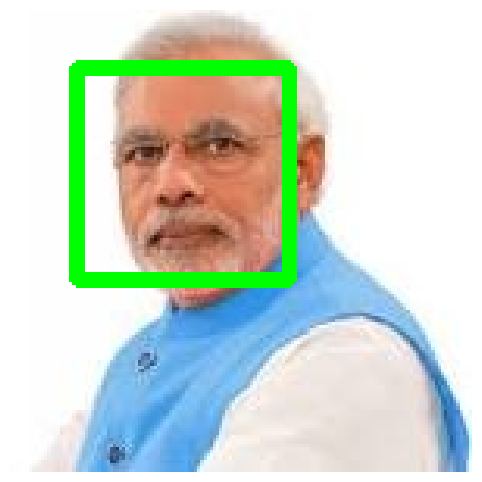

In [40]:
import cv2
import matplotlib.pyplot as plt

# Load Haar Cascade
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_frontalface_default.xml")

# Load image
img = cv2.imread("modiji.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Detect faces
faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=4, minSize=(50, 50))
print(f"Detected {len(faces)} face(s)")

# Draw bounding boxes
for (x, y, w, h) in faces:
    cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 3)  # green rectangle

# Convert BGR to RGB for matplotlib
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Display
plt.figure(figsize=(8, 6))
plt.imshow(img_rgb)
plt.axis("off")
plt.show()

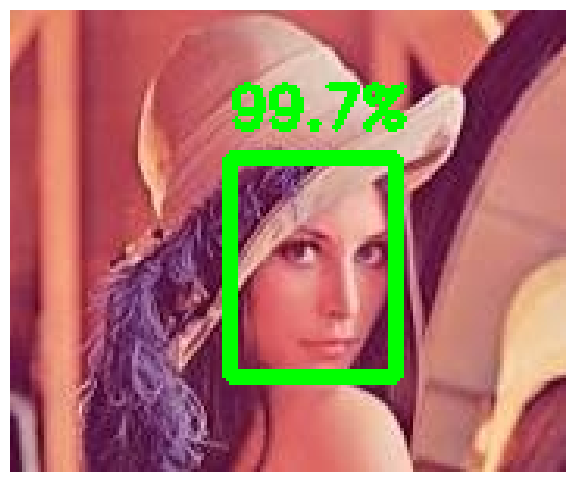

In [48]:
'''
Deep Neural Networks for Face Fetection

Deep neural network based face detection is more reliable. OpenCV provides a pre-trained ResNet SSD model
(deploy.prototxt + .caffemodel) for face detection. Download the model files (you only need to do this once):

deploy.prototxt → network architecture
res10_300x300_ssd_iter_140000_fp16.caffemodel → trained weights
You can get them here:

Prototxt
Caffemodel
Place them in your working folder.
'''

import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load DNN face detector
modelFile = "res10_300x300_ssd_iter_140000_fp16.caffemodel"
configFile = "deploy.prototxt"
net = cv2.dnn.readNetFromCaffe(configFile, modelFile)

# Load image
img = cv2.imread("leena.jpg")
if img is None:
    raise ValueError("Could not load image. Check path!")

(h, w) = img.shape[:2]

# Prepare input blob for the DNN
blob = cv2.dnn.blobFromImage(cv2.resize(img, (300, 300)), 1.0,
                             (300, 300), (104.0, 177.0, 123.0))

# Set input and forward pass
net.setInput(blob)
detections = net.forward()

# Draw detections
for i in range(0, detections.shape[2]):
    confidence = detections[0, 0, i, 2]
    if confidence > 0.5:  # confidence threshold
        box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
        (x1, y1, x2, y2) = box.astype("int")
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 3)
        text = f"{confidence*100:.1f}%"
        cv2.putText(img, text, (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,255,0), 2)

# Convert BGR → RGB for matplotlib
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Display
plt.figure(figsize=(8,6))
plt.imshow(img_rgb)
plt.axis("off")
plt.show()

In [59]:
import cv2
import numpy as np
import os

# Helper: load image safely
def load_and_preprocess(path, size=(200, 200)):
    img = cv2.imread(path, 0)  # grayscale
    if img is None:
        raise ValueError(f"Could not load image: {path}")
    img_resized = cv2.resize(img, size)
    return img_resized

# Load training images
train_paths = ["cat.jpg", "dog.jpg"]
labels = [0, 1]

faces = []
valid_labels = []

for path, label in zip(train_paths, labels):
    try:
        face = load_and_preprocess(path)
        faces.append(face)
        valid_labels.append(label)
        print(f"Loaded {path}")
    except ValueError as e:
        print(e)

if len(faces) == 0:
    raise RuntimeError("No training images found!")

# Train recognizer
recognizer = cv2.face.LBPHFaceRecognizer_create()
recognizer.train(faces, np.array(valid_labels))

# Load test image
test_img = load_and_preprocess("testimg.jpg")

# Predict
label, confidence = recognizer.predict(test_img)
print(f"Predicted label: {label}, confidence: {confidence}")

Loaded cat.jpg
Loaded dog.jpg
Predicted label: 1, confidence: 92.61649295387139
